<a href="https://colab.research.google.com/github/emmelinetsen/faceAI/blob/master/Main_CNN_FER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **1.Import Libarary&Path**

In [0]:
import PIL
from PIL import Image
from skimage import data_dir,io,transform,color
import numpy as np
import pandas as pd

In [167]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Make the new feature Embarrassd face**

Download images from google images and preprocess images(in another notebooks).

In [0]:
root_dir = '/content/drive/My Drive/'
base_dir = root_dir + 'CMPE258/team_project/'

In [0]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import losses
from keras import metrics
from keras.utils.np_utils import to_categorical
import os, datetime
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from skimage import data_dir,io,transform,color

In [0]:
import random
import shutil
from shutil import copy2
%matplotlib inline
import glob

## **2.Convert img into numeric**

In [0]:
import os

In [0]:
data_gray_path=base_dir+'data/Embarrassed_selected/gray_embarrassed/'

Functions to convert imgs to array , and convert array to imgs.

In [0]:
def imgs_to_arr(path):    
    data = []
    file_names=os.listdir(path)
    for filename in file_names:                 
        file_path =path+filename               
        img = Image.open(file_path)                         
        re_img = np.asarray(img)        
        image = np.zeros((48,48,3))
        image[:,:,0] = re_img
        image[:,:,1] = re_img
        image[:,:,2] = re_img
        data.append(np.array(image.astype(np.uint8)))    
    return data
     
def arr_to_imgs(imgs_array):
    images=[]
    for img_arr in imgs_array:
        img=Image.fromarray(np.uint8(img_arr))
        images.append(img)
    return images
        
                  


In [0]:
data_gray_path_root=base_dir+'data/Embarrassed_selected/gray_embarrassed/'
data_embarrassed = imgs_to_arr(data_gray_path_root)
len(data_embarrassed)


540

In [0]:
images_embarrassed=arr_to_imgs(data_embarrassed)

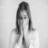

In [0]:
images_embarrassed[0]

In [0]:
#make dataframe

In [0]:
embarrassed_df=pd.DataFrame({"emotion":7,"array":data_embarrassed})

In [0]:
embarrassed_df.array[0]

array([[[201, 201, 201],
        [204, 204, 204],
        [210, 210, 210],
        ...,
        [211, 211, 211],
        [208, 208, 208],
        [205, 205, 205]],

       [[201, 201, 201],
        [205, 205, 205],
        [210, 210, 210],
        ...,
        [212, 212, 212],
        [208, 208, 208],
        [206, 206, 206]],

       [[202, 202, 202],
        [206, 206, 206],
        [211, 211, 211],
        ...,
        [213, 213, 213],
        [209, 209, 209],
        [206, 206, 206]],

       ...,

       [[179, 179, 179],
        [183, 183, 183],
        [189, 189, 189],
        ...,
        [206, 206, 206],
        [203, 203, 203],
        [202, 202, 202]],

       [[177, 177, 177],
        [181, 181, 181],
        [187, 187, 187],
        ...,
        [204, 204, 204],
        [202, 202, 202],
        [200, 200, 200]],

       [[176, 176, 176],
        [180, 180, 180],
        [186, 186, 186],
        ...,
        [203, 203, 203],
        [201, 201, 201],
        [199, 199, 199]]

In [0]:
#embarrassed_df.to_csv(base_dir+'data/embarrassed_array.csv',index=None)

In [0]:
#embarrassed_df.to_json(base_dir+'data/embarrassed_array.json')

## **3.Merge data**

In [0]:
data_raw=pd.read_csv(base_dir+'data/fer2013/fer2013.csv')

In [0]:
#data_embarrassed=pd.read_csv(base_dir+'data/embarrassed_array.csv')

In [0]:
data_embarrassed = embarrassed_df

In [0]:
data_raw.head()

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


In [0]:
data_raw.emotion.value_counts()

3    8989
6    6198
4    6077
2    5121
0    4953
5    4002
1     547
Name: emotion, dtype: int64

In [0]:
data_raw.pixels[0]

'70 80 82 72 58 58 60 63 54 58 60 48 89 115 121 119 115 110 98 91 84 84 90 99 110 126 143 153 158 171 169 172 169 165 129 110 113 107 95 79 66 62 56 57 61 52 43 41 65 61 58 57 56 69 75 70 65 56 54 105 146 154 151 151 155 155 150 147 147 148 152 158 164 172 177 182 186 189 188 190 188 180 167 116 95 103 97 77 72 62 55 58 54 56 52 44 50 43 54 64 63 71 68 64 52 66 119 156 161 164 163 164 167 168 170 174 175 176 178 179 183 187 190 195 197 198 197 198 195 191 190 145 86 100 90 65 57 60 54 51 41 49 56 47 38 44 63 55 46 52 54 55 83 138 157 158 165 168 172 171 173 176 179 179 180 182 185 187 189 189 192 197 200 199 196 198 200 198 197 177 91 87 96 58 58 59 51 42 37 41 47 45 37 35 36 30 41 47 59 94 141 159 161 161 164 170 171 172 176 178 179 182 183 183 187 189 192 192 194 195 200 200 199 199 200 201 197 193 111 71 108 69 55 61 51 42 43 56 54 44 24 29 31 45 61 72 100 136 150 159 163 162 163 170 172 171 174 177 177 180 187 186 187 189 192 192 194 195 196 197 199 200 201 200 197 201 137 58 98 92

In [0]:
emotion_map = {0: 'Angry', 1: 'Digust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral'}

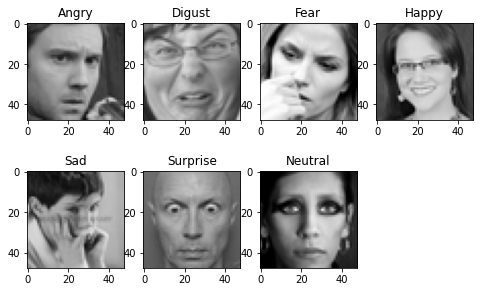

In [0]:
def pixels_to_image(pixels):    
    img = np.array(pixels.split())
    img = img.reshape(48,48)
    image = np.zeros((48,48,3))
    image[:,:,0] = img
    image[:,:,1] = img
    image[:,:,2] = img
    return np.array(image.astype(np.uint8))

plt.figure(0, figsize=(8,5))
for i in range(1,8):
    row = data_raw[data_raw['emotion'] == i-1].iloc[0]
    img = pixels_to_image(row['pixels'])
    emotion = emotion_map[row['emotion']]
    plt.subplot(2,4,i)
    plt.imshow(img)
    plt.title(emotion)

plt.show()  

In [0]:
data_raw['array'] = data_raw['pixels'].apply(pixels_to_image)

In [0]:
data_raw.head()

,emotion,pixels,Usage,array
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training,"[[[70, 70, 70], [80, 80, 80], [82, 82, 82], [7..."
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training,"[[[151, 151, 151], [150, 150, 150], [147, 147,..."
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training,"[[[231, 231, 231], [212, 212, 212], [156, 156,..."
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training,"[[[24, 24, 24], [32, 32, 32], [36, 36, 36], [3..."
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training,"[[[4, 4, 4], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [0]:
#data_raw.to_csv(base_dir+'data/data_raw_array.csv',index=None)

In [0]:
#data_raw =pd.read_csv(base_dir+'data/data_raw_array.csv')

In [0]:
#data_raw.to_json(base_dir+'data/data_raw_array.json')

In [0]:
train_raw = data_raw[data_raw['Usage']=='Training'].copy()
valid_raw = data_raw[data_raw['Usage']=='PublicTest'].copy()
test_raw  = data_raw[data_raw['Usage']=='PrivateTest'].copy()

In [0]:
train_raw.head()

,emotion,pixels,Usage,array
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training,"[[[70, 70, 70], [80, 80, 80], [82, 82, 82], [7..."
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training,"[[[151, 151, 151], [150, 150, 150], [147, 147,..."
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training,"[[[231, 231, 231], [212, 212, 212], [156, 156,..."
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training,"[[[24, 24, 24], [32, 32, 32], [36, 36, 36], [3..."
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training,"[[[4, 4, 4], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [0]:
train_raw.shape

(28709, 4)

In [0]:
train_raw.emotion.value_counts()

3    7215
6    4965
4    4830
2    4097
0    3995
5    3171
1     436
Name: emotion, dtype: int64

In [0]:
valid_raw.head()

,emotion,pixels,Usage,array
28709,0,254 254 254 254 254 249 255 160 2 58 53 70 77 ...,PublicTest,"[[[254, 254, 254], [254, 254, 254], [254, 254,..."
28710,1,156 184 198 202 204 207 210 212 213 214 215 21...,PublicTest,"[[[156, 156, 156], [184, 184, 184], [198, 198,..."
28711,4,69 118 61 60 96 121 103 87 103 88 70 90 115 12...,PublicTest,"[[[69, 69, 69], [118, 118, 118], [61, 61, 61],..."
28712,6,205 203 236 157 83 158 120 116 94 86 155 180 2...,PublicTest,"[[[205, 205, 205], [203, 203, 203], [236, 236,..."
28713,3,87 79 74 66 74 96 77 80 80 84 83 89 102 91 84 ...,PublicTest,"[[[87, 87, 87], [79, 79, 79], [74, 74, 74], [6..."


In [0]:
valid_raw.shape

(3589, 4)

In [0]:
valid_raw.emotion.value_counts()

3    895
4    653
6    607
2    496
0    467
5    415
1     56
Name: emotion, dtype: int64

In [0]:
test_raw.head()

,emotion,pixels,Usage,array
32298,0,170 118 101 88 88 75 78 82 66 74 68 59 63 64 6...,PrivateTest,"[[[170, 170, 170], [118, 118, 118], [101, 101,..."
32299,5,7 5 8 6 7 3 2 6 5 4 4 5 7 5 5 5 6 7 7 7 10 10 ...,PrivateTest,"[[[7, 7, 7], [5, 5, 5], [8, 8, 8], [6, 6, 6], ..."
32300,6,232 240 241 239 237 235 246 117 24 24 22 13 12...,PrivateTest,"[[[232, 232, 232], [240, 240, 240], [241, 241,..."
32301,4,200 197 149 139 156 89 111 58 62 95 113 117 11...,PrivateTest,"[[[200, 200, 200], [197, 197, 197], [149, 149,..."
32302,2,40 28 33 56 45 33 31 78 152 194 200 186 196 20...,PrivateTest,"[[[40, 40, 40], [28, 28, 28], [33, 33, 33], [5..."


In [0]:
test_raw.shape

(3589, 4)

In [0]:
test_raw.emotion.value_counts()

3    879
6    626
4    594
2    528
0    491
5    416
1     55
Name: emotion, dtype: int64

In [0]:
data_embarrassed.head()

,emotion,array
0,7,"[[[201, 201, 201], [204, 204, 204], [210, 210,..."
1,7,"[[[251, 251, 251], [251, 251, 251], [251, 251,..."
2,7,"[[[254, 254, 254], [254, 254, 254], [254, 254,..."
3,7,"[[[255, 255, 255], [255, 255, 255], [254, 254,..."
4,7,"[[[254, 254, 254], [253, 253, 253], [253, 253,..."


In [0]:
from sklearn.model_selection import train_test_split as tts
embarrassed_train, embarrassed_test, y_train,y_test=tts(data_embarrassed.array,data_embarrassed.emotion,test_size=0.1)

In [0]:
embarrassed_train, embarrassed_valid, y_train,y_valid=tts(embarrassed_train,y_train,test_size=0.11)

In [0]:
embarrassed_train.shape

(432,)

In [0]:
embarrassed_test.shape

(54,)

In [0]:
embarrassed_valid.shape

(54,)

The amount is similar with emotion[1] 'Digust'

###3.1 Merge train_data

In [0]:
X_train = train_raw['array'].append(embarrassed_train, ignore_index=True)

In [0]:
X_train[0].dtype

dtype('uint8')

In [0]:
X_train.head(10)

0    [[[70, 70, 70], [80, 80, 80], [82, 82, 82], [7...
1    [[[151, 151, 151], [150, 150, 150], [147, 147,...
2    [[[231, 231, 231], [212, 212, 212], [156, 156,...
3    [[[24, 24, 24], [32, 32, 32], [36, 36, 36], [3...
4    [[[4, 4, 4], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...
5    [[[55, 55, 55], [55, 55, 55], [55, 55, 55], [5...
6    [[[20, 20, 20], [17, 17, 17], [19, 19, 19], [2...
7    [[[77, 77, 77], [78, 78, 78], [79, 79, 79], [7...
8    [[[85, 85, 85], [84, 84, 84], [90, 90, 90], [1...
9    [[[255, 255, 255], [254, 254, 254], [255, 255,...
Name: array, dtype: object

In [0]:
X_train.tail(10)

29131    [[[239, 239, 239], [239, 239, 239], [239, 239,...
29132    [[[253, 253, 253], [253, 253, 253], [255, 255,...
29133    [[[251, 251, 251], [255, 255, 255], [255, 255,...
29134    [[[108, 108, 108], [108, 108, 108], [109, 109,...
29135    [[[255, 255, 255], [255, 255, 255], [255, 255,...
29136    [[[143, 143, 143], [146, 146, 146], [149, 149,...
29137    [[[254, 254, 254], [254, 254, 254], [254, 254,...
29138    [[[254, 254, 254], [254, 254, 254], [254, 254,...
29139    [[[205, 205, 205], [205, 205, 205], [205, 205,...
29140    [[[44, 44, 44], [39, 39, 39], [50, 50, 50], [6...
Name: array, dtype: object

In [0]:
y_train = train_raw['emotion'].append(y_train, ignore_index=True)

In [0]:
y_train.shape

(29141,)

In [0]:
y_train.head()

0    0
1    0
2    2
3    4
4    6
Name: emotion, dtype: int64

In [0]:
data_train =pd.DataFrame({"emotion":y_train,"array":X_train})

In [0]:
data_train.head()

,emotion,array
0,0,"[[[70, 70, 70], [80, 80, 80], [82, 82, 82], [7..."
1,0,"[[[151, 151, 151], [150, 150, 150], [147, 147,..."
2,2,"[[[231, 231, 231], [212, 212, 212], [156, 156,..."
3,4,"[[[24, 24, 24], [32, 32, 32], [36, 36, 36], [3..."
4,6,"[[[4, 4, 4], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [0]:
data_train.emotion.value_counts()

3    7215
6    4965
4    4830
2    4097
0    3995
5    3171
1     436
7     432
Name: emotion, dtype: int64

In [0]:
#data_train.to_csv(base_dir+'data/data_train_new.csv')

In [0]:
data_train.to_json(base_dir+'data/data_train_new.json')

###3.2 Merge test_data

In [0]:
X_test = test_raw['array'].append(embarrassed_test, ignore_index=True)
y_test = test_raw['emotion'].append(y_test, ignore_index=True)
data_test =pd.DataFrame({"emotion":y_test,"array":X_test})
data_test.shape

(3643, 2)

In [0]:
#data_test.to_csv(base_dir+'data/data_test_new.csv')

In [0]:
#data_test.to_json(base_dir+'data/data_test_new.json')

###3.3 Merge valid_data

In [0]:
X_valid = valid_raw['array'].append(embarrassed_valid, ignore_index=True)
y_valid = valid_raw['emotion'].append(y_valid, ignore_index=True)
data_valid =pd.DataFrame({"emotion":y_valid,"array":X_valid})
data_valid.shape

(3643, 2)

In [0]:
X_valid[0].shape

(48, 48, 3)

In [0]:
#data_valid.to_json(base_dir+'data/data_valid_new.json')

In [0]:
#data_valid_json = pd.read_json(base_dir+'data/data_valid_new.json')

In [0]:
#data_valid_json.array[0]

In [0]:
def arr_data_to_str(data_arrs):
  data_arr_list=[]
  for i in range(0,len(data_arrs)):
     array_data = np.array(data_arrs[i]).reshape(6912)
     str_array=' '.join([str(x) for x in array_data])
     data_arr_list.append(str_array)
  return data_arr_list

#data_train.array=arr_data_to_str(data_train.array)
#data_train.to_csv(base_dir+'data/data_train_new22.csv',index=None)
#data_test.array=arr_data_to_str(data_test.array)
#data_test.to_csv(base_dir+'data/data_test_new22.csv',index=None)
#data_valid.array=arr_data_to_str(data_valid.array)
#data_valid.to_csv(base_dir+'data/data_valid_new22.csv',index=None)   

## **4. Show the images**

In [0]:
import PIL
from PIL import Image

In [0]:
emotion_map_all = {0: 'Angry', 1: 'Digust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral',7:'Embarrassed'}

In [0]:
def show_img(data):
  plt.figure(0, figsize=(8,5))
  for i in range(1,9):
    row = data[data['emotion'] == i-1].iloc[0]
    img = Image.fromarray(np.uint8(row['array']))
    emotion = emotion_map_all[row['emotion']]       
    plt.subplot(2,4,i)
    plt.imshow(img)
    plt.title(emotion)

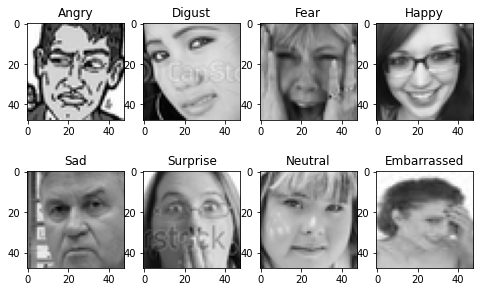

In [0]:
show_img(data_valid)

## **5. Data Visualization**

In [0]:
import matplotlib.pyplot as plt

(array([3995.,    0.,  436.,    0., 4097.,    0., 7215.,    0., 4830.,
           0., 3171.,    0., 4965.,    0.,  432.]),
 array([0.        , 0.46666667, 0.93333333, 1.4       , 1.86666667,
        2.33333333, 2.8       , 3.26666667, 3.73333333, 4.2       ,
        4.66666667, 5.13333333, 5.6       , 6.06666667, 6.53333333,
        7.        ]),
 <a list of 15 Patch objects>)

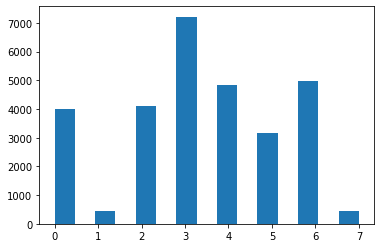

In [0]:
plt.hist(data_train['emotion'],bins = 15)

In [0]:
#sns.pairplot(data_train['emotion'], hue='categorical')

## **6. Load new_data from csv**

In [0]:
import numpy as np
import pandas as pd

In [171]:
from google.colab import drive
drive.mount('/content/drive')
#Jacky's dir
#root_dir = '/content/drive/My Drive/'
#base_dir = root_dir + 'CMPE258/team_project/'

#Jerry's dir
root_dir = '/content/drive/My Drive/'
base_dir = root_dir + '258_final_project/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
def load_data_json(data_dir):
  data_train= pd.read_json(data_dir+'data_train_new.json')
  data_test = pd.read_json(data_dir+'data_test_new.json')
  data_valid = pd.read_json(data_dir+'data_valid_new.json')  
  return data_train,data_test,data_valid

def load_data_csv(data_dir):
  data_train= pd.read_csv(data_dir+'data_train_new22.csv')
  data_test = pd.read_csv(data_dir+'data_test_new22.csv')
  data_valid = pd.read_csv(data_dir+'data_valid_new22.csv')
  data_train.array=data_train.array.apply(arrs_str_to_arrs)
  data_test.array=data_test.array.apply(arrs_str_to_arrs)  
  data_valid.array=data_valid.array.apply(arrs_str_to_arrs)    
  return data_train,data_test,data_valid

def arrs_str_to_arrs(array_str):  
  img_arr = np.array([int(x) for x in array_str.split()])
  img_arr = img_arr.reshape(48,48,3)
  return img_arr 

def make_Xy(data_train,data_test,data_valid):  
  X_train=data_train.array
  y_train=data_train.emotion
  X_test=data_test.array
  y_test=data_test.emotion
  X_valid=data_valid.array
  y_valid=data_valid.emotion
  return X_train,y_train,X_test,y_test,X_valid,y_valid

#load data from new_csv
data_train,data_test,data_valid=load_data_csv(base_dir+'data/')
X_train,y_train,X_test,y_test,X_valid,y_valid=make_Xy(data_train,data_test,data_valid)


In [173]:
print(data_valid.array[0].shape)

(48, 48, 3)


In [174]:
data_valid.array[0].dtype

dtype('int64')

## **7.CNN Model**

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
%matplotlib inline

np.random.seed(2)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import itertools

from keras.utils.np_utils import to_categorical # convert to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras.utils import to_categorical

In [0]:
X_train.shape

(29141,)

###7.1 Reshape the data

In [0]:
data_X = np.array(X_train.tolist()).reshape(-1,48,48,3)/255.0 
data_y = to_categorical(y_train, 8)  

In [0]:
valid_X = np.array(X_valid.tolist()).reshape(-1,48,48,3)/255.0 
valid_y = to_categorical(y_valid, 8)  

In [0]:
test_X = np.array(X_test.tolist()).reshape(-1,48,48,3)/255.0 
test_y = to_categorical(y_test, 8)  

In [0]:
data_X.shape

(29141, 48, 48, 3)

7.2 ImageDataGenerator

In [0]:
# data generator
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        #zoom_range=0.1,
                        horizontal_flip=True)

### 7.3 CNN_Modeling

In [0]:
#Model function
def CNN_model():
  from keras.models import Sequential
  from keras.layers import BatchNormalization
  model = Sequential([
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu', input_shape = (48,48,3)),#Dropout(0.75),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.75),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.75),
         BatchNormalization(axis=3),
         MaxPool2D(pool_size=(2,2)),
         Dropout(0.5),

         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         MaxPool2D(pool_size=(2,2)), 
         Dropout(0.5),

         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', activation ='relu'),#Dropout(0.25),
         BatchNormalization(axis=3),
         MaxPool2D(pool_size=(2,2)), 
         Dropout(0.5),   

         Flatten(),   
         Dense(256, activation = "relu"),
         Dropout(0.75),   
         (Dense(8, activation = "softmax"))])


  model.compile(optimizer = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0) , 
                loss = "categorical_crossentropy", metrics=["accuracy"])

  return model  

In [0]:
model_test = CNN_model()

In [0]:
model_test.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_91 (Conv2D)           (None, 48, 48, 64)        1792      
_________________________________________________________________
batch_normalization_46 (Batc (None, 48, 48, 64)        256       
_________________________________________________________________
conv2d_92 (Conv2D)           (None, 48, 48, 64)        36928     
_________________________________________________________________
batch_normalization_47 (Batc (None, 48, 48, 64)        256       
_________________________________________________________________
conv2d_93 (Conv2D)           (None, 48, 48, 64)        36928     
_________________________________________________________________
batch_normalization_48 (Batc (None, 48, 48, 64)        256       
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 24, 24, 64)      

In [0]:
batch_size = 128
num_epochs = 50

Three times running the Model:


1.   with epochs 50, add dropout 0.25 
2.   with epochs 25, add bantchnormalize on each layer without zoom image generator 
3.   with epochs 50, add dropout 0.25 on each layer and bantchnormalize 
on each layer without zoom image generator 
4.   with epochs 75, add dropout 0.5 and bantchnormalize on each layer without zoom image generator **(BEST MODEL)**
5.   with epochs 25, add dropout 0.75 and bantchnormalize on each layer without zoom image generator 





In [0]:
from keras.callbacks import EarlyStopping, TensorBoard
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)
run_eagerly = EarlyStopping(monitor='loss', min_delta=0, patience=20, verbose=1, mode='auto') 

history_1 = model_test.fit_generator(data_generator.flow(data_X,data_y, batch_size),
                                steps_per_epoch=len(data_X) / batch_size,
                                epochs=num_epochs,
                                verbose=2, 
                                validation_data=(valid_X, valid_y),
                                callbacks=[tensorboard_callback,run_eagerly])

Epoch 1/50


/usr/local/lib/python3.6/dist-packages/keras/callbacks/callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (0.228894). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


 - 21s - loss: 2.9337 - accuracy: 0.2318 - val_loss: 2.0218 - val_accuracy: 0.2276
Epoch 2/50
 - 19s - loss: 1.9977 - accuracy: 0.2460 - val_loss: 1.9452 - val_accuracy: 0.2402
Epoch 3/50
 - 19s - loss: 1.9352 - accuracy: 0.2474 - val_loss: 1.9103 - val_accuracy: 0.2457
Epoch 4/50
 - 19s - loss: 1.9044 - accuracy: 0.2472 - val_loss: 1.8890 - val_accuracy: 0.2457
Epoch 5/50
 - 19s - loss: 1.8854 - accuracy: 0.2476 - val_loss: 1.8762 - val_accuracy: 0.2457
Epoch 6/50
 - 19s - loss: 1.8742 - accuracy: 0.2473 - val_loss: 1.8691 - val_accuracy: 0.2457
Epoch 7/50
 - 19s - loss: 1.8675 - accuracy: 0.2473 - val_loss: 1.8652 - val_accuracy: 0.2457
Epoch 8/50
 - 19s - loss: 1.8673 - accuracy: 0.2472 - val_loss: 1.8635 - val_accuracy: 0.2454
Epoch 9/50
 - 19s - loss: 1.8656 - accuracy: 0.2473 - val_loss: 1.8625 - val_accuracy: 0.2457
Epoch 10/50
 - 19s - loss: 1.8641 - accuracy: 0.2474 - val_loss: 1.8618 - val_accuracy: 0.2457
Epoch 11/50
 - 19s - loss: 1.8602 - accuracy: 0.2476 - val_loss: 1.861

### 7.4 Tensorboard

In [0]:
!tensorboard dev upload --logdir ./logs --name "Image data generator TensorBoard"

2020-05-16 23:48:52.479349: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Data for the "graphs" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Upload started and will continue reading any new data as it's added
to the logdir. To stop uploading, press Ctrl-C.
View your TensorBoard live at: https://tensorboard.dev/experiment/GkvcQqC8Sl2UVUlHvxPaDg/

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/uploader/uploader_main.py", line 446, in execute
    uploader.start_uploading()
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/uploader/uploader.py", line 191, in start_uploading
    self._logdir_poll_rate_limiter.tick()
  File "/usr/local/lib/python3.6/dist-packages/tensorboard/uploader/util.py", line 45, in tick
    self._time.sleep(wait_secs)

TensorBoard:https://tensorboard.dev/experiment/GkvcQqC8Sl2UVUlHvxPaDg/

In [0]:
%load_ext tensorboard

%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

### 7.5 CNN Test results

In [0]:
results = model_test.evaluate(test_X, test_y)

3643/3643 [==============================] - 1s 274us/step


In [0]:
results

[0.9598802224189413, 0.6453472375869751]

## **8. Save Model to Google Drive**

In [0]:
#model_test.save(base_dir+'CNN_Model.h5')
model_test.save(base_dir+'CNN_Model_2.h5')

## **9. Load Model from Google Drive**

In [0]:
from keras.models import load_model
 
# load model
model1 = load_model(base_dir+'CNN_Model_2.h5')


In [177]:
results = model1.evaluate(test_X, test_y)

3643/3643 [==============================] - 1s 338us/step


In [178]:
results

[0.9598802224189413, 0.6453472375869751]

## **9. Model Visualization**

In [0]:
from keras import models
layer_outputs = [layer.output for layer in model1.layers[:8]]
activation_model = models.Model(inputs=model1.input, outputs=layer_outputs)

In [0]:
img_tensor = image.img_to_array(img_test6)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.

In [192]:
print(img_tensor.shape)

(1, 48, 48, 3)


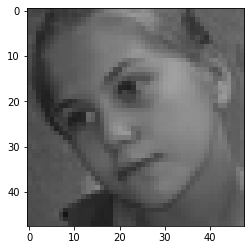

In [193]:
plt.imshow(img_tensor[0])
plt.show()

In [196]:
activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 48, 48, 64)


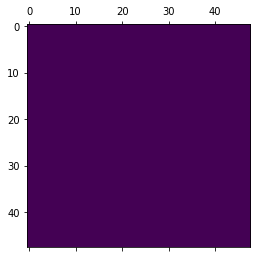

In [197]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

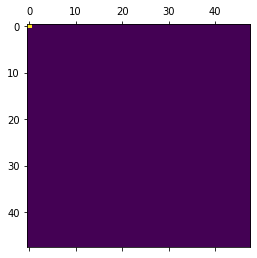

In [198]:
plt.matshow(first_layer_activation[0, :, :, 30], cmap='viridis')
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide


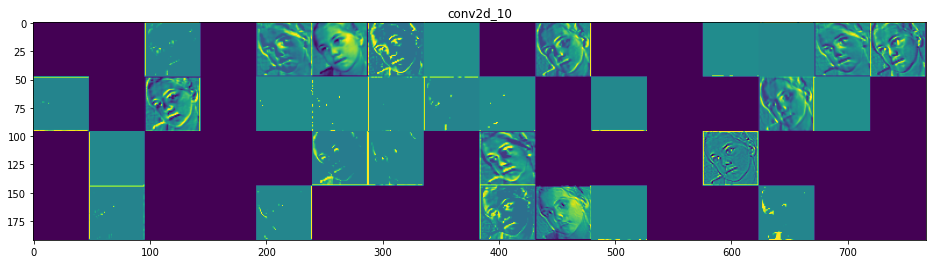

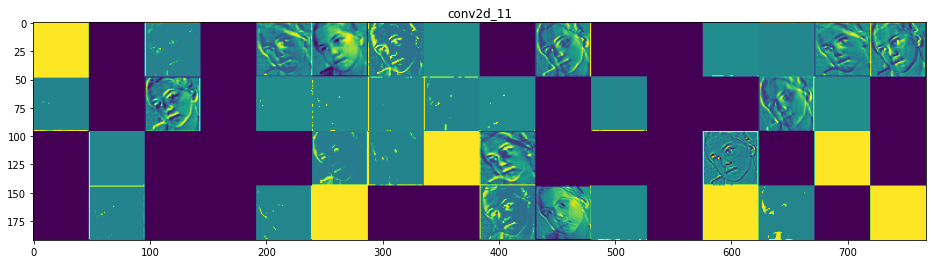

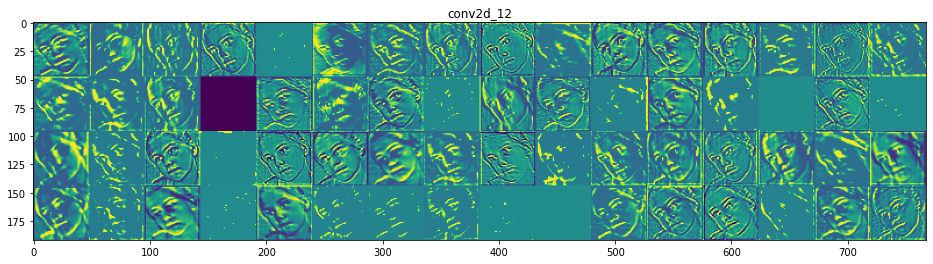

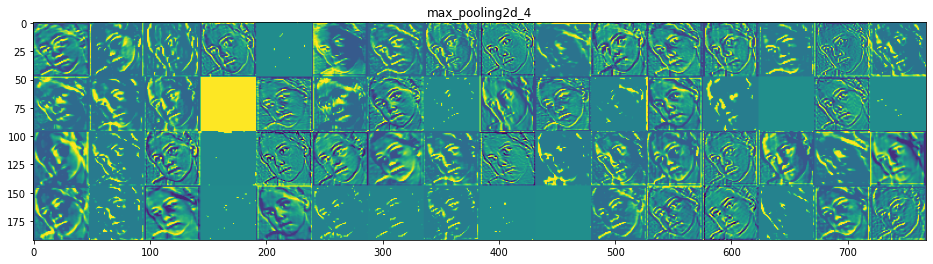

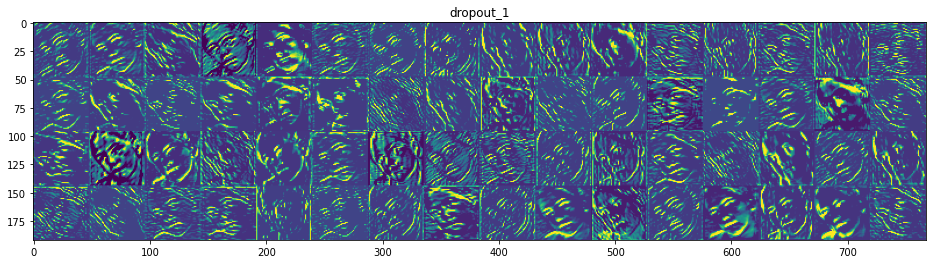

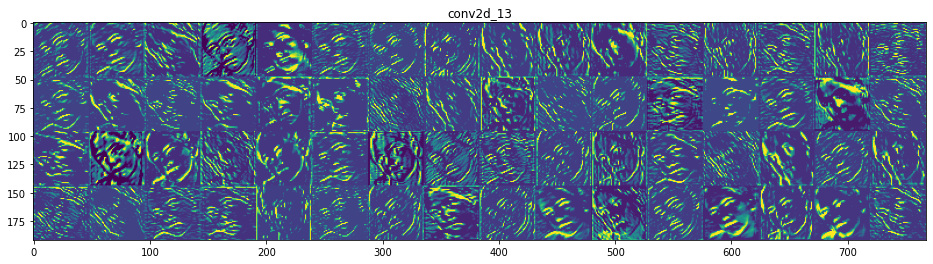

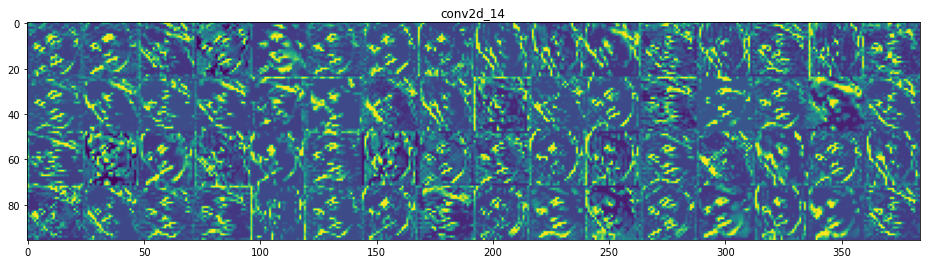

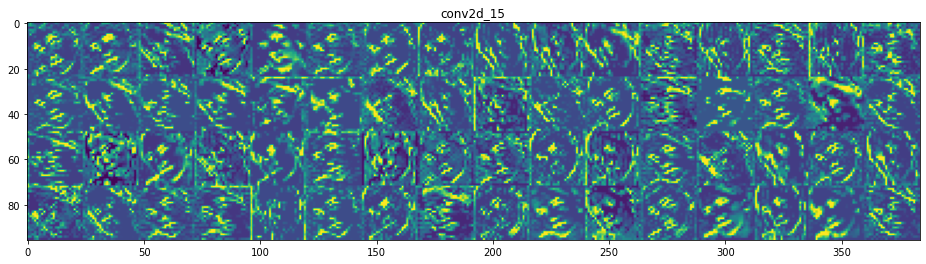

In [199]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

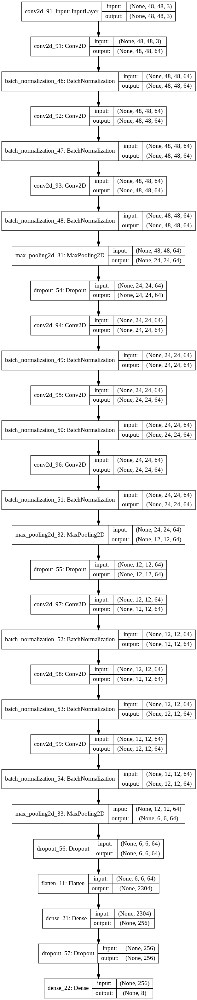

In [0]:
from keras.utils import plot_model
plot_model(model_test, show_shapes=True, to_file='CNN.png')

## **10. ResNet Model**

### **10.1 Create Model & Model Visualization**

Model: "ResNet8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 48, 48, 3)    0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 54, 54, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_29 (Conv2D)              (None, 22, 22, 96)   34944       zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
batch_normalization_19 (BatchNo (None, 22, 22, 96)   384         conv2d_29[0][0]                  
____________________________________________________________________________________________

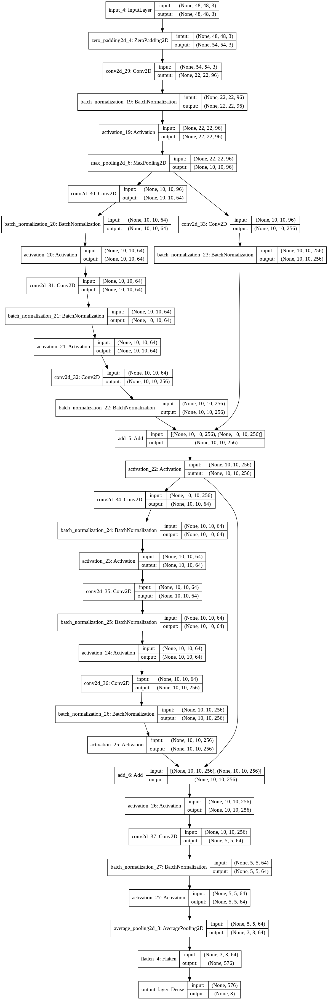

In [0]:
import tensorflow as tf
import datetime
import keras.optimizers as optimizers
import keras.losses as losses
from keras.layers import Conv2D, AveragePooling2D,Flatten,Dense,Activation,MaxPooling2D,ZeroPadding2D,BatchNormalization
from keras.callbacks import EarlyStopping, TensorBoard
from keras.models import Model
from keras.layers import Input, Add
from keras.utils import plot_model
from keras.initializers import glorot_uniform

def cv_block(layers_ResNet, filters):
    filter1, filter2, filter3 = filters
    shortcut = layers_ResNet

    layers_ResNet = Conv2D(filters=filter1, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                kernel_initializer=glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis=3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)

    layers_ResNet = Conv2D(filters=filter2, kernel_size=(3, 3), strides=(1, 1), padding='same', 
                 kernel_initializer=glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis=3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)

    layers_ResNet = Conv2D(filters=filter3, kernel_size=(1, 1), strides=(1, 1), padding='valid', 
                  kernel_initializer=glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis=3)(layers_ResNet)

    shortcut = Conv2D(filters=filter3, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                         kernel_initializer=glorot_uniform(seed=0))(shortcut)
    shortcut = BatchNormalization(axis=3)(shortcut)

    layers_ResNet = Add()([layers_ResNet, shortcut])
    layers_ResNet = Activation('relu')(layers_ResNet)

    return layers_ResNet

def id_block(layers_ResNet, filters):
    
    filter1, filter2, filter3 = filters
    shortcut = layers_ResNet
       
    layers_ResNet = Conv2D(filters = filter1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', 
               kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis = 3 )(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)
    
    layers_ResNet = Conv2D(filters = filter2, kernel_size = (2, 2), strides = (1, 1), padding = 'same', 
                kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis = 3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)

    layers_ResNet = Conv2D(filters = filter3, kernel_size = (1, 1), strides = (1, 1), padding = 'valid', 
                kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis = 3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)

    layers_ResNet = Add()([layers_ResNet, shortcut])
    layers_ResNet = Activation('relu')(layers_ResNet)
    
    return layers_ResNet

def create_model_resnet():   
    input0 = Input((48, 48, 3))
    layers_ResNet = ZeroPadding2D((3, 3))(input0)
    #conv_layer1
    layers_ResNet = Conv2D(96, (11, 11), strides = (2, 2), kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis = 3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)
    layers_ResNet = MaxPooling2D((3, 3), strides=(2, 2))(layers_ResNet)
    
    #conv_layer2-4 from cv_block
    layers_ResNet = cv_block(layers_ResNet, [64, 64, 256])
    #conv_layer5-7 from id_block
    layers_ResNet = id_block(layers_ResNet, [64, 64, 256])
    
    #conv_layer8
    layers_ResNet = Conv2D(64, (6, 6),kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    layers_ResNet = BatchNormalization(axis = 3)(layers_ResNet)
    layers_ResNet = Activation('relu')(layers_ResNet)

    layers_ResNet = AveragePooling2D(pool_size=(2,2), padding='same')(layers_ResNet)

    layers_ResNet = Flatten()(layers_ResNet)
    layers_ResNet = Dense(8, activation='softmax', name='output_layer' , kernel_initializer = glorot_uniform(seed=0))(layers_ResNet)
    
    # Create model
    model = Model(inputs = input0, outputs = layers_ResNet, name='ResNet8')

    return model

model_resnet=create_model_resnet()


model_resnet.summary()
plot_model(model_resnet, show_shapes=True, to_file='ResNet8.png')

In [0]:
model_resnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

### **10.2 Train Model**

In [0]:
import os, datetime
from keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.callbacks import ModelCheckpoint as mcp

In [0]:
!pip install pyyaml h5py

In [0]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)
run_eagerly = EarlyStopping(monitor='loss', min_delta=0, patience=20, verbose=1, mode='auto') 

history = model_resnet.fit(data_X,data_y,
                    epochs=20,batch_size=64,
                    validation_data=(valid_X, valid_y),
                    callbacks=[tensorboard_callback,run_eagerly])

Train on 29141 samples, validate on 3643 samples
Epoch 1/20
29141/29141 [==============================] - 39s 1ms/step - loss: 0.4578 - accuracy: 0.8426 - val_loss: 1.9830 - val_accuracy: 0.5202
Epoch 2/20
29141/29141 [==============================] - 38s 1ms/step - loss: 0.1191 - accuracy: 0.9632 - val_loss: 2.1124 - val_accuracy: 0.5597
Epoch 3/20
29141/29141 [==============================] - 38s 1ms/step - loss: 0.0666 - accuracy: 0.9846 - val_loss: 2.2761 - val_accuracy: 0.5380
Epoch 4/20
29141/29141 [==============================] - 38s 1ms/step - loss: 0.0552 - accuracy: 0.9895 - val_loss: 2.3251 - val_accuracy: 0.5284
Epoch 5/20
29141/29141 [==============================] - 38s 1ms/step - loss: 0.0672 - accuracy: 0.9856 - val_loss: 2.6464 - val_accuracy: 0.4774
Epoch 6/20
29141/29141 [==============================] - 38s 1ms/step - loss: 0.1354 - accuracy: 0.9559 - val_loss: 2.6523 - val_accuracy: 0.4996
Epoch 7/20
29141/29141 [==============================] - 38s 1ms/ste

KeyboardInterrupt: ignored

In [0]:
# Save the entire model as a SavedModel.
!mkdir -p saved_model
model_resnet.save('saved_model/resnet8_model1') 

In [0]:
resnet8_model = tf.keras.models.load_model('saved_model/resnet8_model1')

# Check its summary
resnet8_model.summary()

Model: "ResNet8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 48, 48, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 54, 54, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_29 (Conv2D)              (None, 22, 22, 96)   34944       zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
batch_normalization_19 (BatchNo (None, 22, 22, 96)   384         conv2d_29[0][0]                  
____________________________________________________________________________________________

### **10.3 Tensorboard**

In [0]:
%load_ext tensorboard

%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [0]:
results = model_test.evaluate(test_X, test_y)

3643/3643 [==============================] - 2s 624us/step


In [0]:
results

[1.9546029357637902, 0.24128465354442596]

In [0]:
predictions = model_test.predict(test_X)
print(predictions[0].shape)

(8,)


**CNN result for testing**

In [0]:
img_test6=Image.fromarray(np.uint8(X_test[6]))

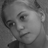

In [0]:
img_test6

In [0]:
y_test[6]

4

In [0]:
label_6=emotion_map_all[y_test[6]]

In [0]:
print(label_6)

Sad


In [0]:
print(np.argmax(predictions[6]))

6


In [0]:
print(np.argmax(test_y[6]))

4


In [0]:
print(np.argmax(predictions[9]))

3


In [0]:
print(np.argmax(test_y[9]))

3


In [0]:
for i in range(0,30):
  if y_test[i] == np.argmax(predictions[i]):
    print(i)

0
5
7
8
9
11
13
15
17
18
20
21
22
23
24
25
26
27
28


In [0]:
y_test[0]

0

In [0]:
predictions[i]

array([4.8118655e-02, 2.7805046e-04, 6.9043440e-01, 5.3784437e-03,
       2.1646273e-01, 7.6111322e-03, 3.1716593e-02, 7.2824862e-09],
      dtype=float32)